In [1]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import datetime
import math
import calendar
from math import radians
from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.feature_selection import RFE
import statsmodels.api as sm

# `Reading and Understanding the Data`

In [2]:
df = pd.read_csv('fraudTrain.csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [3]:
# Let us check if there are null values in the dataset

df.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [4]:
# Including only relevant columns/features in a new dataframe

fraudTrain = df[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraudTrain.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,4.97,F,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0
1,2019-01-01 00:00:44,107.23,F,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0
2,2019-01-01 00:00:51,220.11,M,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0
3,2019-01-01 00:01:16,45.00,M,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0
4,2019-01-01 00:03:06,41.96,M,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0


> - #### Identifying Target Variable - is_fraud

In [5]:
# Converting columns to datetime for fraudTrain

fraudTrain.dob = pd.to_datetime(fraudTrain['dob'])
fraudTrain.trans_date_trans_time = pd.to_datetime(fraudTrain['trans_date_trans_time'])

In [6]:
# Creating a new column called Transaction date and converting into datetime

fraudTrain['Transaction_Date'] = pd.to_datetime(fraudTrain['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraudTrain.Transaction_Date = pd.to_datetime(fraudTrain['Transaction_Date'])

In [7]:
# Creating a new column called Transaction Time

fraudTrain['Transaction_Time'] = pd.to_datetime(fraudTrain['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [8]:
# Creating a new column called Age

fraudTrain['Age'] = round((fraudTrain['Transaction_Date'] - fraudTrain['dob'])/np.timedelta64(1, 'Y'))
fraudTrain.Age = fraudTrain.Age.astype('int')

In [9]:
fraudTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   trans_date_trans_time  1296675 non-null  datetime64[ns]
 1   amt                    1296675 non-null  float64       
 2   gender                 1296675 non-null  object        
 3   lat                    1296675 non-null  float64       
 4   long                   1296675 non-null  float64       
 5   city_pop               1296675 non-null  int64         
 6   dob                    1296675 non-null  datetime64[ns]
 7   merch_lat              1296675 non-null  float64       
 8   merch_long             1296675 non-null  float64       
 9   is_fraud               1296675 non-null  int64         
 10  Transaction_Date       1296675 non-null  datetime64[ns]
 11  Transaction_Time       1296675 non-null  object        
 12  Age                    12966

In [10]:
# Creating a function to calculate the Day of Week

def DoW(x):
    day = datetime.datetime.weekday(x)
    return (calendar.day_name[day])

fraudTrain['Day_of_Week'] = fraudTrain['Transaction_Date'].apply(DoW)

In [11]:
# # Creating a new column Month

fraudTrain['Month'] = pd.DatetimeIndex(fraudTrain.trans_date_trans_time).month

# Making Gender column binary

fraudTrain['gender'] = fraudTrain['gender'].map({'F':1, 'M':0})
fraudTrain['Day_of_Week'] = fraudTrain['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [12]:
# Creating a function to calculate the distance between customer's base location and merchant location

def haversineDistance(lat1,lon1,lat2,lon2):
    Lat_Dist = radians(lat2 - lat1)
    Long_Dist = radians(lon2 - lon1)

    ans = (pow(math.sin(Lat_Dist / 2), 2) + pow(math.sin(Long_Dist / 2), 2) * math.cos(lat1) * math.cos(lat2));
    radius = 6371
    cal = 2 * math.asin(math.sqrt(ans))
    return radius * cal

Dist = []
for a,b,c,d in zip(fraudTrain['lat'], fraudTrain['long'], fraudTrain['merch_lat'], fraudTrain['merch_long']):
    Dist.append(haversineDistance(a,b,c,d))

fraudTrain['Dist'] = Dist
fraudTrain.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,Transaction_Date,Transaction_Time,Age,Day_of_Week,Month,Dist
0,2019-01-01 00:00:18,4.97,1,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0,2019-01-01,00:00:18,31,2,1,10.509708
1,2019-01-01 00:00:44,107.23,1,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0,2019-01-01,00:00:44,41,2,1,30.171468
2,2019-01-01 00:00:51,220.11,0,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0,2019-01-01,00:00:51,57,2,1,107.746268
3,2019-01-01 00:01:16,45.00,0,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0,2019-01-01,00:01:16,52,2,1,97.629363
4,2019-01-01 00:03:06,41.96,0,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0,2019-01-01,00:03:06,33,2,1,66.236025


In [13]:
# Dropping unnecessay columns

fraudTrain.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob',
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraudTrain.head()

,amt,gender,city_pop,is_fraud,Age,Day_of_Week,Month,Dist
0,4.97,1,3495,0,31,2,1,10.509708
1,107.23,1,149,0,41,2,1,30.171468
2,220.11,0,4154,0,57,2,1,107.746268
3,45.00,0,1939,0,52,2,1,97.629363
4,41.96,0,99,0,33,2,1,66.236025


# `Exploratory Data Analysis`

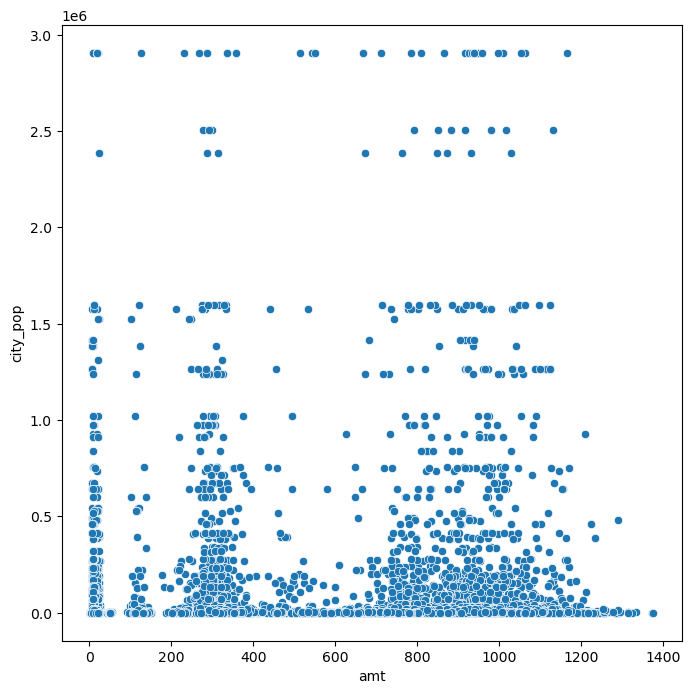

In [14]:
plt.figure(figsize = (8,8))
sns.scatterplot(data = fraudTrain[fraudTrain['is_fraud'] == 1], x = 'amt', y = 'city_pop')
plt.show()

- No clear relation between city population and the amount of spending

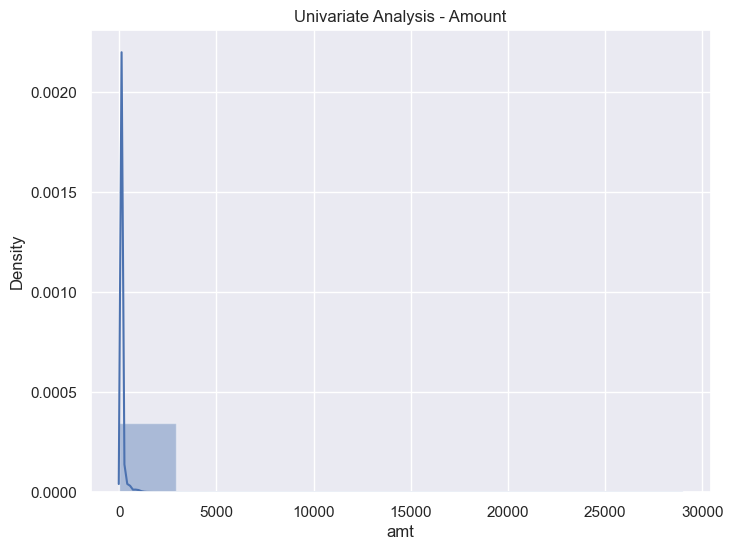

In [15]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable amt with log transformations

In [16]:
fraudTrain['amt'] = np.log(fraudTrain['amt'])

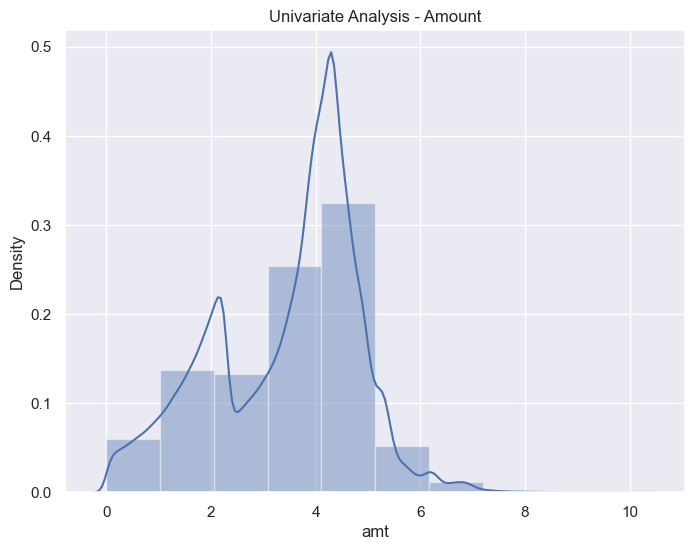

In [17]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- Skewness is treated

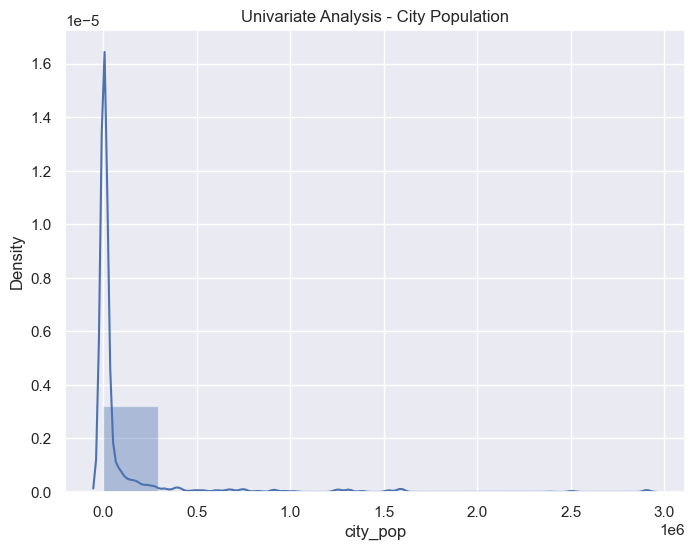

In [18]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable city_pop with log transformations

In [19]:
fraudTrain['city_pop'] = np.log(fraudTrain['city_pop'])

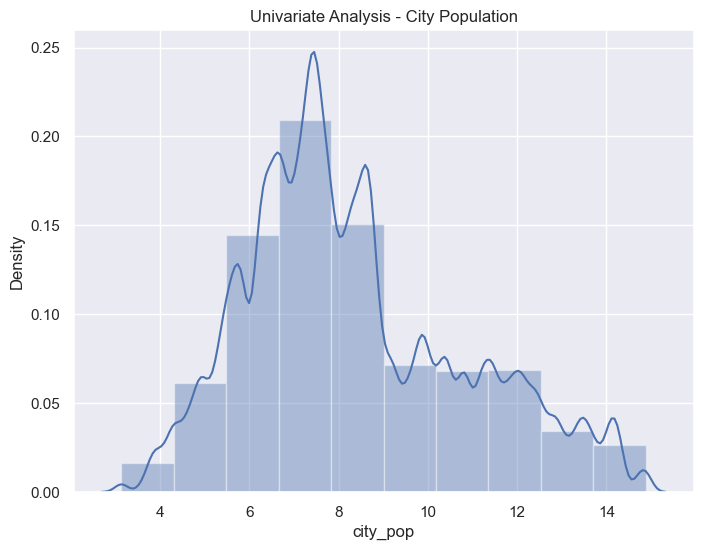

In [20]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

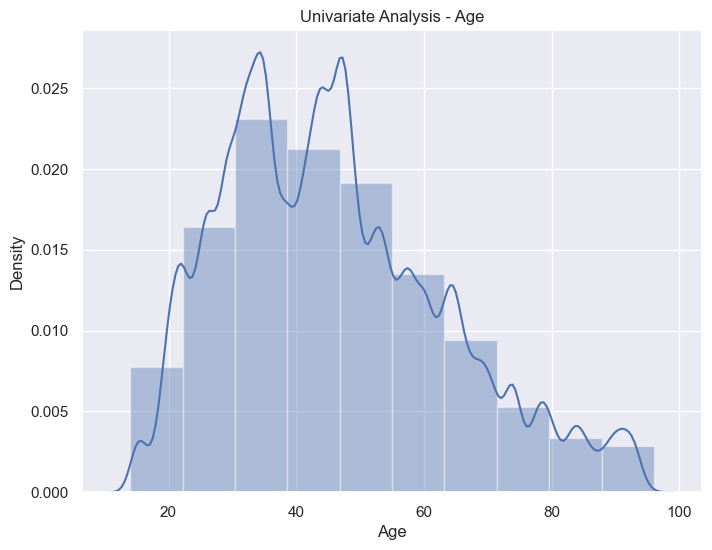

In [21]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['Age'], bins = 10, kde = True)
plt.title('Univariate Analysis - Age')
plt.show()

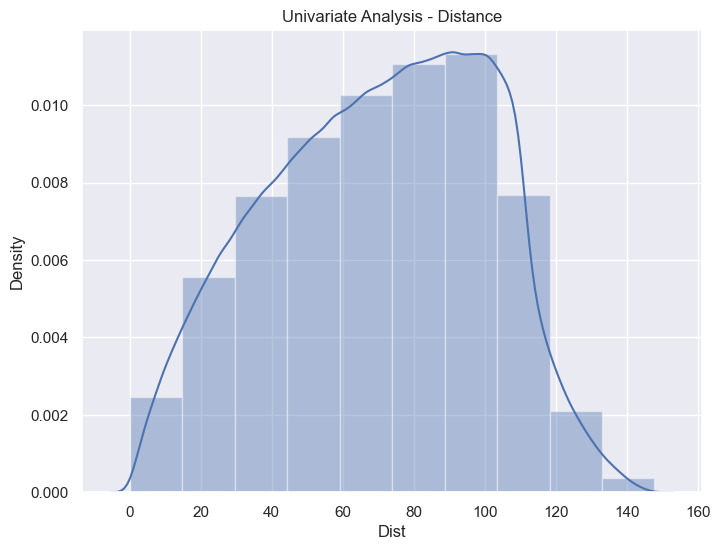

In [22]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraudTrain['Dist'], bins = 10, kde = True)
plt.title('Univariate Analysis - Distance')
plt.show()

- No major skewness found in Distance and Age variables

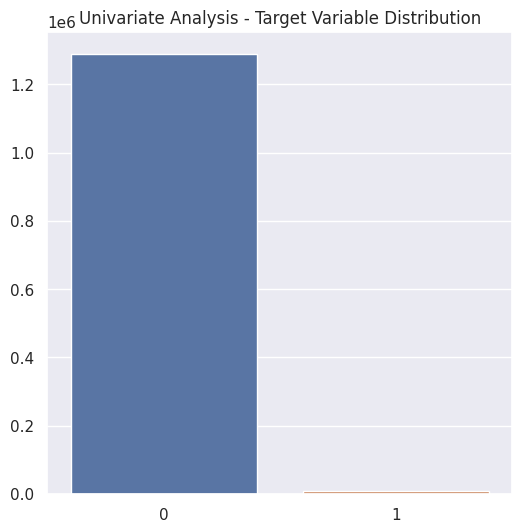

In [26]:
# Let us see the Target Variable distribution across the dataset

x = [0, 1]
y = [fraudTrain.is_fraud.value_counts()[0],fraudTrain.is_fraud.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Target Variable Distribution')
plt.show()

- The data shows clear imbalance in the target variable which needs to be handled by sampling methods

Text(0.5, 1.0, 'Univariate Analysis - Gender Distribution')

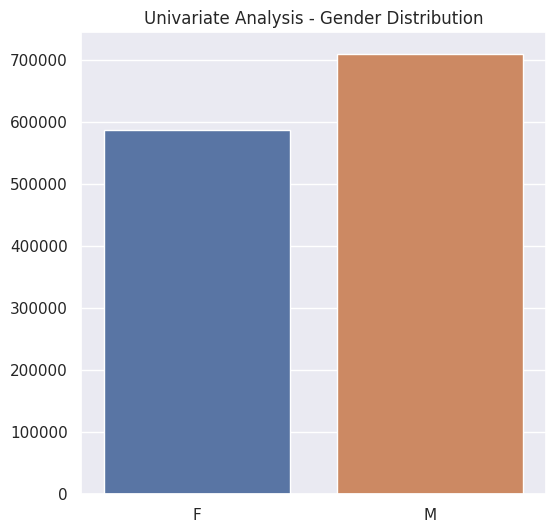

In [27]:
# Let us see the Gender distribution across the dataset

x = ['F', 'M']
y = [fraudTrain.gender.value_counts()[0], fraudTrain.gender.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Gender Distribution')

# `Train/Test Data Splitting`

In [28]:
y = fraudTrain.pop('is_fraud')
X = fraudTrain

In [29]:
from sklearn import model_selection

# To handle data imbalance while splitting, using the stratify method

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, stratify = y, random_state=42)

In [30]:
#Confirming shapes of the test and train datasets

X_train.shape, X_test.shape

((972506, 7), (324169, 7))

## Scaling of variables for Logistic Regression

In [31]:
fraudTrain.columns

Index(['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist'], dtype='object')

In [32]:
# Making a copy of the X_train and scaling it as that is specific only to Logistic Regression

X_train_lr = X_train.copy()

scaler = MinMaxScaler()
X_train_lr[['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']] = scaler.fit_transform(X_train[['amt','gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']])
X_train_lr.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
267436,0.482372,0.0,0.448670,0.353659,1.000000,0.363636,0.376031
233159,0.251400,1.0,0.230283,0.463415,0.833333,0.272727,0.642221
430072,0.441626,0.0,0.470635,0.560976,0.666667,0.545455,0.718947
236662,0.474693,1.0,0.698418,0.414634,1.000000,0.272727,0.510120
450357,0.462170,0.0,0.477590,0.841463,0.666667,0.545455,0.540952


In [33]:
# Confirming if scaling has worked

X_train_lr.describe()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
count,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000
mean,0.338391,0.546699,0.444523,0.390205,0.511807,0.467545,0.473872
std,0.135778,0.497815,0.208761,0.212136,0.366377,0.310577,0.206361
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.221962,0.000000,0.295607,0.231707,0.166667,0.181818,0.314929
50%,0.377921,1.000000,0.397163,0.365854,0.500000,0.454545,0.488222
75%,0.432530,1.000000,0.577530,0.524390,0.833333,0.727273,0.640732
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# `Model Building and Hyperparameter Tuning`

> The algorithms that will be used in order to create classification models that would be sensitive to detecting fraudulent transactions are:
- Logistic Regression
- Decision Trees
- Random Forest
- XGBoost

> Each algorithm will have an unsampled model and will then be compared by using sampling methods - SMOTE and ADASYN
> Let us proceed with the model building part in the order mentioned above:

## 1.1 Logistic Regression - Unsampled

In [34]:
logreg_unsampled = LogisticRegression().fit(X_train_lr,y_train)

#### Hyperparameter tuning using Grid Search CV

In [35]:
from sklearn.model_selection import GridSearchCV

In [36]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_1 = GridSearchCV(estimator=logreg_unsampled,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [37]:
%%time
grid_search_1.fit(X_train_lr, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 2.77 s, sys: 1.34 s, total: 4.12 s
Wall time: 54.4 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [38]:
grid_search_1.best_score_

0.0

# `Model Evaluation`
> The metric used to evaluate the models is - Recall
- Recall attempts to answer the following question: What proportion of actual positives was identified correctly?
- Mathematically, recall is defined as:

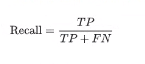

In [39]:
def evaluate_model_lr_unsampled(classifier):
    y_train_pred = classifier.predict(X_train_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train, y_train_pred))
    print(metrics.confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))


In [40]:

lr_unsampled = grid_search_1.best_estimator_
evaluate_model_lr_unsampled(lr_unsampled)

Train set performance:
0.0
[[966877      0]
 [  5629      0]]
-------------------------
Test set performance:
0.9952051145444859
[[  9693 312599]
 [     9   1868]]


In [41]:
from sklearn.metrics import roc_curve

#### ROC Curve

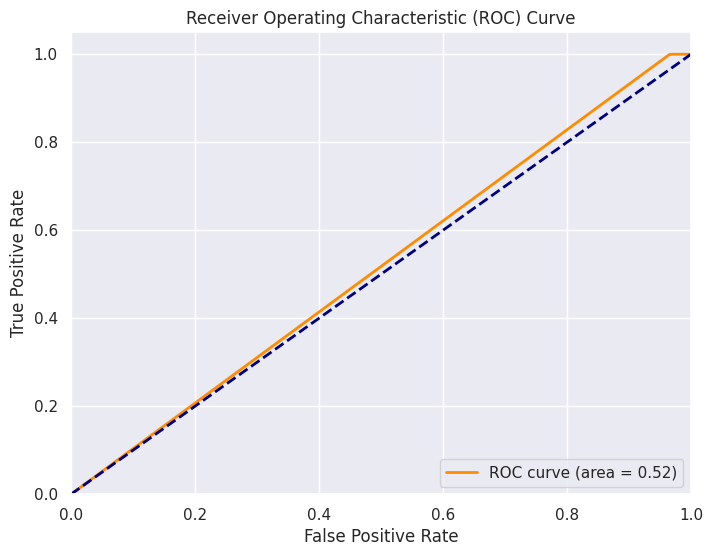

In [42]:
y_pred_prob = logreg_unsampled.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Logistic Regression - Unsampled:
- Recall on Train: 0.0
- Recall on Test: 0.99
- Area Under the Curve: 0.52

## Let us try out two sampling methods - SMOTE and ADASYN

In [43]:
from imblearn.over_sampling import SMOTE, ADASYN
X_train_smote_lr, y_train_smote_lr = SMOTE().fit_resample(X_train_lr, y_train)
X_train_adasyn_lr, y_train_adasyn_lr = ADASYN().fit_resample(X_train_lr, y_train)

## 1.2 Logistic Regression with SMOTE

In [44]:
logreg_smote = LogisticRegression().fit(X_train_smote_lr,y_train_smote_lr)

In [45]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_2 = GridSearchCV(estimator=logreg_smote,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [46]:
%%time
grid_search_2.fit(X_train_smote_lr, y_train_smote_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 5.97 s, sys: 2.31 s, total: 8.28 s
Wall time: 1min 30s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [47]:
grid_search_2.best_score_

0.7793711083924398

In [48]:
def evaluate_model_lr_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_smote_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_smote_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [49]:
lr_smote = grid_search_2.best_estimator_
evaluate_model_lr_smote(lr_smote)

Train set performance:
0.7793752462826192
[[777959 188918]
 [213317 753560]]
-------------------------
Test set performance:
1.0
[[     0 322292]
 [     0   1877]]


#### ROC Curve

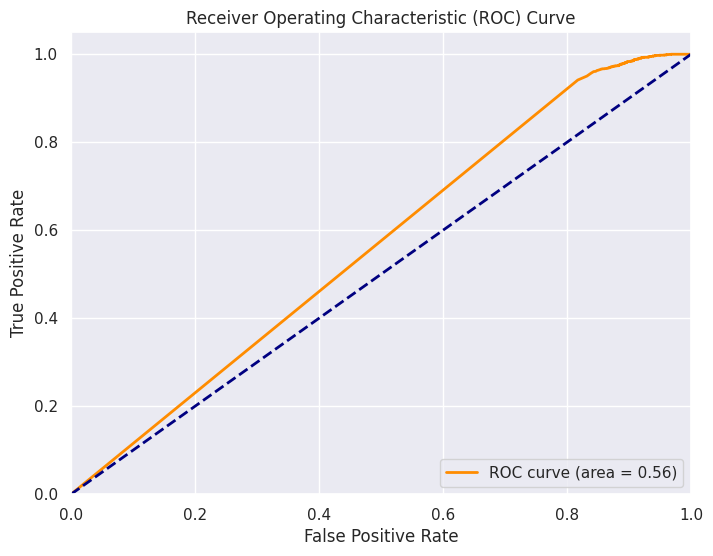

In [50]:
y_pred_prob = logreg_smote.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Logistic Regression - SMOTE:
- Recall on Train: 0.77
- Recall on Test: 1.0
- Area Under the Curve: 0.56

## 1.3 Logistic Regression with ADASYN

In [51]:
logreg_adasyn = LogisticRegression().fit(X_train_adasyn_lr,y_train_adasyn_lr)

In [52]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_3 = GridSearchCV(estimator=logreg_adasyn,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [53]:
%%time
grid_search_3.fit(X_train_adasyn_lr, y_train_adasyn_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 5.31 s, sys: 1.98 s, total: 7.29 s
Wall time: 1min 22s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [54]:
grid_search_3.best_score_

0.7314231027882675

In [55]:
def evaluate_model_lr_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_adasyn_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_adasyn_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [56]:
lr_adasyn = grid_search_3.best_estimator_
evaluate_model_lr_adasyn(lr_adasyn)

Train set performance:
0.7314365526873933
[[724939 241938]
 [259580 706970]]
-------------------------
Test set performance:
1.0
[[     5 322287]
 [     0   1877]]


#### ROC Curve

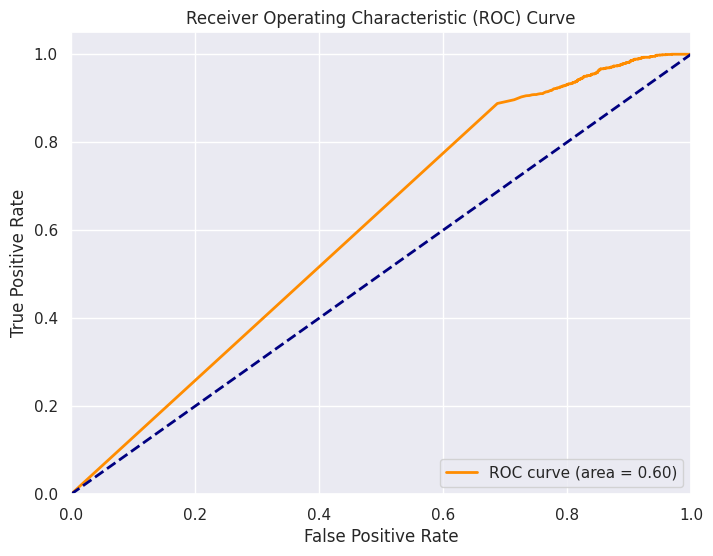

In [57]:
y_pred_prob = logreg_adasyn.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Logistic Regression - ADASYN:
- Recall on Train: 0.73
- Recall on Test: 1.0
- Area Under the Curve: 0.60

-----------------------------

# 2.1 Decision Tree Classifier - Unsampled

In [58]:
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

### Creating Helper Functions

In [59]:
def get_graph(classifier):
    dot_data = StringIO()

    export_graphviz(classifier, out_file = dot_data, filled = True, rounded = True,
               feature_names=X.columns,
               class_names=['No Fraud', 'Fraud'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [60]:
def evaluate_model_unsampled(classifier):
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train, y_train_pred))
    print(confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

### Hyper-parameter tuning using Grid Search CV

In [61]:
dt_unsampled = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [62]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_4 = GridSearchCV(estimator=dt_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [63]:
%%time
grid_search_4.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 11.1 s, sys: 1.62 s, total: 12.7 s
Wall time: 7min 1s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [64]:
grid_search_4.best_score_

0.33167744227353463

In [65]:
dt_best = grid_search_4.best_estimator_
evaluate_model_unsampled(dt_best)

Train set performance:
0.30982412506661927
[[966063    814]
 [  3885   1744]]
-------------------------
Test set performance:
0.2855620671283964
[[321988    304]
 [  1341    536]]


In [66]:
grid_search_4.best_params_

{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 80}

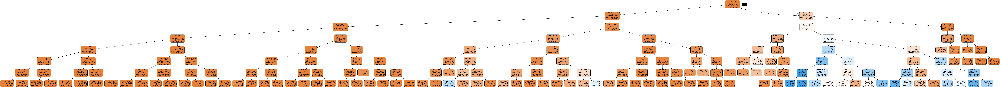

In [67]:
gph = get_graph(dt_best)
Image(gph.create_png())

#### ROC Curve

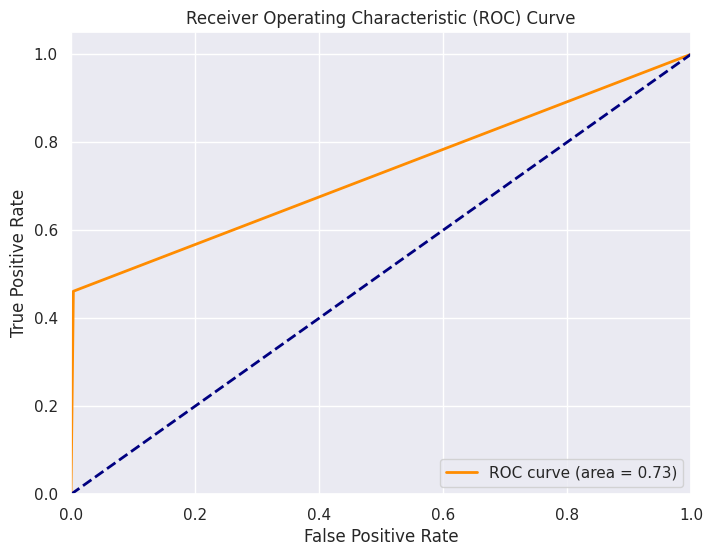

In [68]:
y_pred_prob = dt_unsampled.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Decision Trees - Unsampled:
- Recall on Train: 0.30
- Recall on Test: 0.28
- Area Under the Curve: 0.73

## 2.2 Decision Tree with SMOTE

In [69]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [70]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)

### Creating Helper Functions

In [71]:
def evaluate_model_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_smote, y_train_pred))
    print(confusion_matrix(y_train_smote, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [72]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_5 = GridSearchCV(estimator=dt_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [73]:
%%time
grid_search_5.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 28.1 s, sys: 2.44 s, total: 30.6 s
Wall time: 17min 17s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [74]:
grid_search_5.best_score_

0.8590679085279908

In [75]:
dt_smote = grid_search_5.best_estimator_
evaluate_model_smote(dt_smote)

Train set performance:
0.8638420398871832
[[885972  80905]
 [131648 835229]]
-------------------------
Test set performance:
0.8268513585508791
[[295144  27148]
 [   325   1552]]


In [76]:
grid_search_5.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.348466 to fit



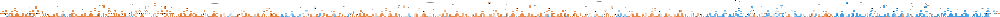

In [77]:
gph = get_graph(dt_smote)
Image(gph.create_png())

#### ROC Curve

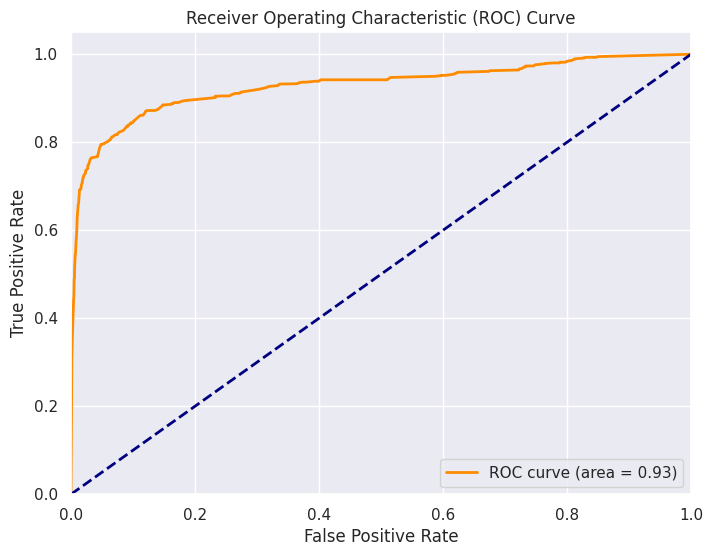

In [79]:
y_pred_prob = dt_smote.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Decision Trees - SMOTE:
- Recall on Train: 0.86
- Recall on Test: 0.82
- Area Under the Curve: 0.93

## 2.3 Decision Tree with ADASYN

In [80]:
X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train, y_train)

### Creating Helper Functions

In [81]:
def evaluate_model_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_adasyn, y_train_pred))
    print(confusion_matrix(y_train_adasyn, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [82]:
dt_adasyn = DecisionTreeClassifier(random_state=42).fit(X_train_adasyn,y_train_adasyn)

In [83]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_6 = GridSearchCV(estimator=dt_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [84]:
%%time
grid_search_6.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 26.5 s, sys: 2.25 s, total: 28.8 s
Wall time: 15min 37s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [85]:
grid_search_6.best_score_

0.847769238108518

In [86]:
dt_adasyn = grid_search_6.best_estimator_
evaluate_model_adasyn(dt_adasyn)

Train set performance:
0.8522104420471438
[[888499  78378]
 [143257 826074]]
-------------------------
Test set performance:
0.8257858284496538
[[295982  26310]
 [   327   1550]]


In [87]:
grid_search_6.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.357231 to fit



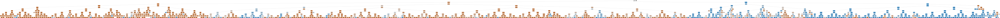

In [88]:
gph = get_graph(dt_adasyn)
Image(gph.create_png())

#### ROC Curve

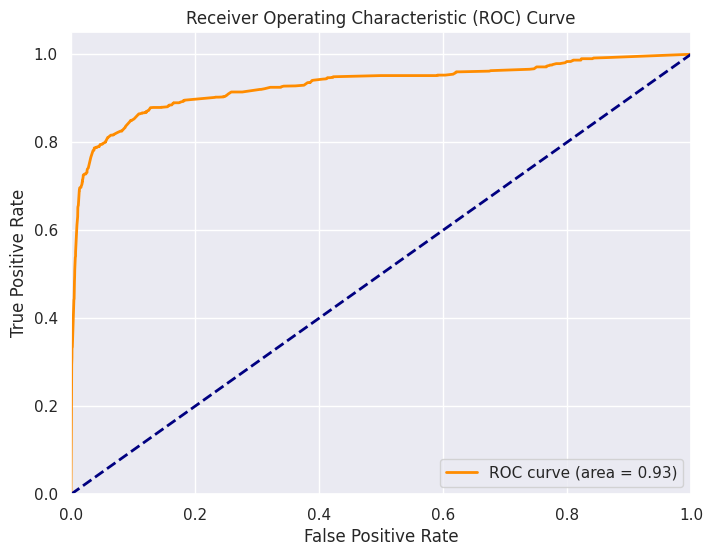

In [89]:
y_pred_prob = dt_adasyn.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Decision Trees - ADASYN:
- Recall on Train: 0.85
- Recall on Test: 0.82
- Area Under the Curve: 0.93

---------------

# 3.1 Random Forest - Unsampled

In [90]:
from sklearn.ensemble import RandomForestClassifier

In [91]:
rf_unsampled = RandomForestClassifier(random_state=42).fit(X_train, y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [92]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:


params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_7 = GridSearchCV(estimator=rf_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [93]:
%%time
grid_search_7.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 40.3 s, sys: 3.46 s, total: 43.7 s
Wall time: 21min 26s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [94]:
rf_best = grid_search_7.best_estimator_
evaluate_model_unsampled(rf_best)

Train set performance:
0.22632794457274827
[[966547    330]
 [  4355   1274]]
-------------------------
Test set performance:
0.19659030367607885
[[322157    135]
 [  1508    369]]


In [95]:
grid_search_7.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 15}

#### ROC Curve

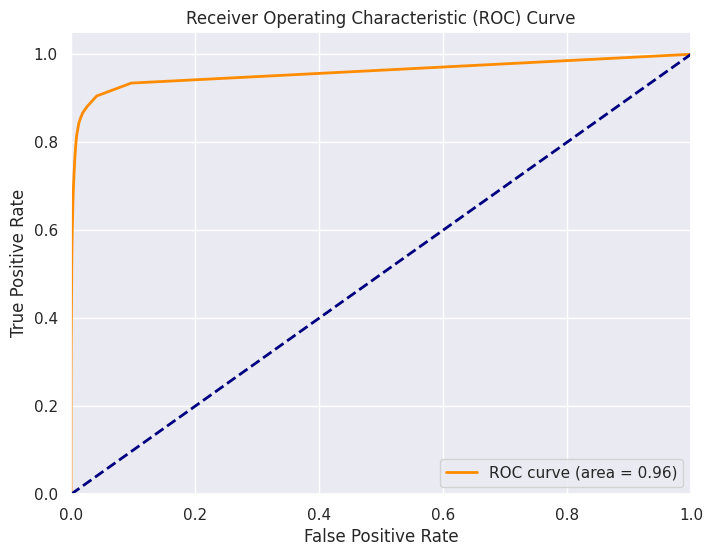

In [96]:
y_pred_prob = rf_unsampled.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Random Forest - Unsampled:
- Recall on Train: 0.22
- Recall on Test: 0.19
- Area Under the Curve: 0.96

# 3.2 Random Forest - SMOTE

In [97]:
rf_smote = RandomForestClassifier(random_state=42).fit(X_train_smote, y_train_smote)

In [98]:
params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_8 = GridSearchCV(estimator=rf_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [99]:
%%time
grid_search_8.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 1min 42s, sys: 7.84 s, total: 1min 49s
Wall time: 55min 16s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [100]:
rf_smote = grid_search_8.best_estimator_
evaluate_model_smote(rf_smote)

Train set performance:
0.8181940412275812
[[929159  37718]
 [175784 791093]]
-------------------------
Test set performance:
0.7789025039957379
[[309593  12699]
 [   415   1462]]


In [101]:
grid_search_8.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 80,
 'n_estimators': 15}

#### ROC Curve

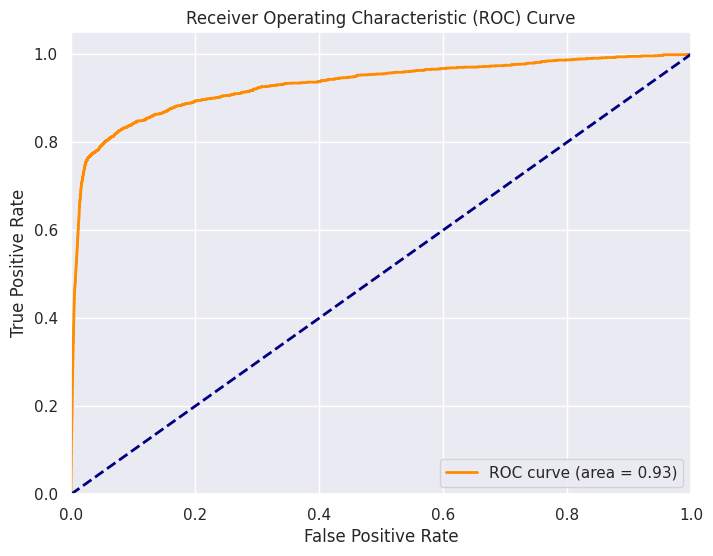

In [104]:
y_pred_prob = rf_smote.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Random Forest - SMOTE:
- Recall on Train: 0.81
- Recall on Test: 0.77
- Area Under the Curve: 0.93

# 3.3 Random Forest - ADASYN

In [105]:
rf_adasyn = RandomForestClassifier(random_state=42).fit(X_train_adasyn, y_train_adasyn)

In [106]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_9 = GridSearchCV(estimator=rf_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [107]:
%%time
grid_search_9.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 1min 10s, sys: 6.72 s, total: 1min 17s
Wall time: 46min 55s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [108]:
grid_search_9.best_score_

0.8125913679794676

In [109]:
rf_adasyn = grid_search_9.best_estimator_
evaluate_model_adasyn(rf_adasyn)

Train set performance:
0.8156666814534973
[[925613  41264]
 [178680 790651]]
-------------------------
Test set performance:
0.7900905700586042
[[308439  13853]
 [   394   1483]]


In [110]:
grid_search_9.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 10}

#### ROC Curve

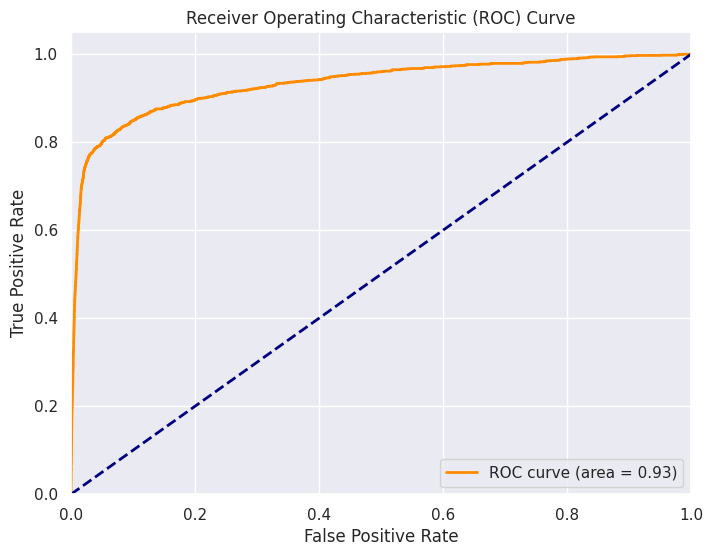

In [111]:
y_pred_prob = rf_adasyn.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Random Forest - ADASYN:
- Recall on Train: 0.81
- Recall on Test: 0.79
- Area Under the Curve: 0.93

-----

# 4.1 XGBoost - Unsampled

In [112]:
from xgboost import XGBClassifier

In [113]:
xgb_unsampled = XGBClassifier().fit(X_train, y_train)

In [114]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1,0.3,0.5]
}

grid_search_10 = GridSearchCV(estimator=xgb_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [115]:
%%time
grid_search_10.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[10:50:20] WARNING: ../src/learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

CPU times: user 2min 25s, sys: 6.1 s, total: 2min 31s
Wall time: 47min 44s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'learning_rate': [0.1, 0.3, 0.5], 'max_depth': [10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [116]:
xgb_best_unsampled = grid_search_10.best_estimator_
evaluate_model_unsampled(xgb_best_unsampled)

Train set performance:
0.6653046722330787
[[966686    191]
 [  1884   3745]]
-------------------------
Test set performance:
0.460841768779968
[[322046    246]
 [  1012    865]]


In [117]:
grid_search_10.best_params_

{'criterion': 'gini',
 'learning_rate': 0.5,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

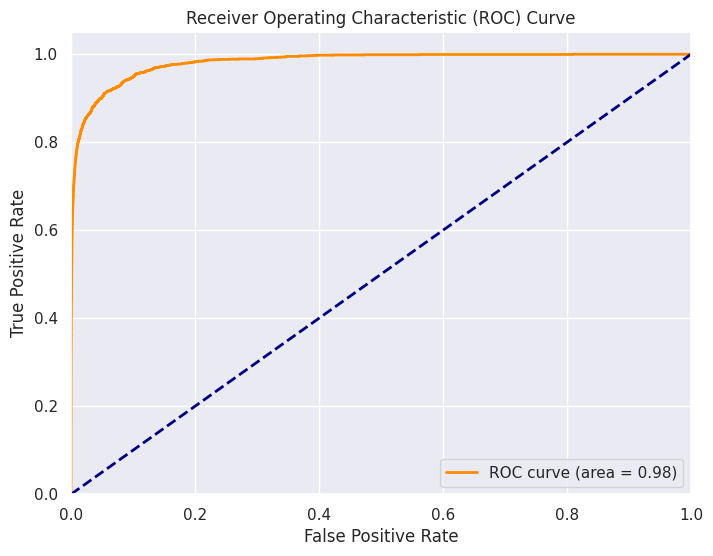

In [118]:
y_pred_prob = xgb_unsampled.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for XGBoost - Unsampled:
- Recall on Train: 0.66
- Recall on Test: 0.46
- Area Under the Curve: 0.98

# 4.2 XGBoost - SMOTE

In [119]:
xgb_smote = XGBClassifier().fit(X_train_smote, y_train_smote)

In [120]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_11 = GridSearchCV(estimator=xgb_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [121]:
%%time
grid_search_11.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[11:48:40] WARNING: ../src/learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

CPU times: user 6min 6s, sys: 6.71 s, total: 6min 13s
Wall time: 48min 17s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [122]:
xgb_best_smote = grid_search_11.best_estimator_
evaluate_model_smote(xgb_best_smote)

Train set performance:
0.8696928358002104
[[914127  52750]
 [125991 840886]]
-------------------------
Test set performance:
0.8098028769312733
[[304255  18037]
 [   357   1520]]


In [123]:
grid_search_11.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

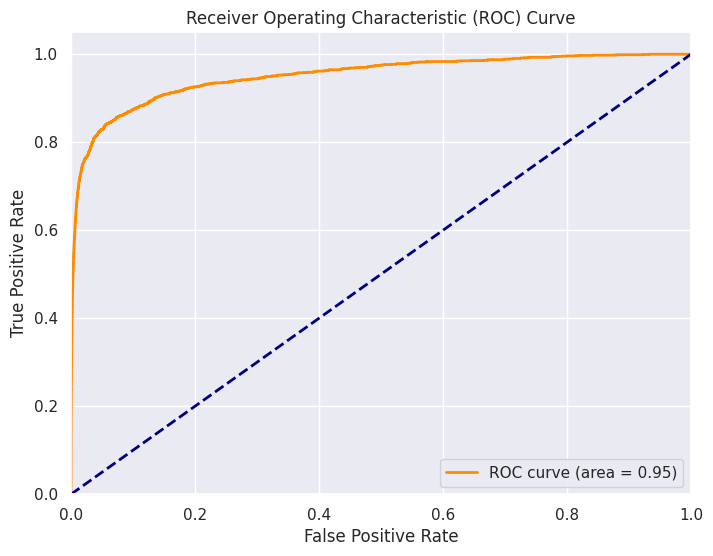

In [127]:
y_pred_prob = xgb_smote.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for XGBoost - SMOTE:
- Recall on Train: 0.86
- Recall on Test: 0.80
- Area Under the Curve: 0.95

# 4.3 XGBoost - ADASYN

In [128]:
xgb_adasyn = XGBClassifier().fit(X_train_adasyn, y_train_adasyn)

In [129]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_12 = GridSearchCV(estimator=xgb_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [130]:
%%time
grid_search_12.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[13:06:43] WARNING: ../src/learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

CPU times: user 5min 18s, sys: 5.25 s, total: 5min 23s
Wall time: 42min 6s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [131]:
xgb_best_adasyn = grid_search_12.best_estimator_
evaluate_model_adasyn(xgb_best_adasyn)

Train set performance:
0.8663439011029256
[[910158  56719]
 [129557 839774]]
-------------------------
Test set performance:
0.8119339371337241
[[302835  19457]
 [   353   1524]]


In [132]:
grid_search_12.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

#### ROC Curve

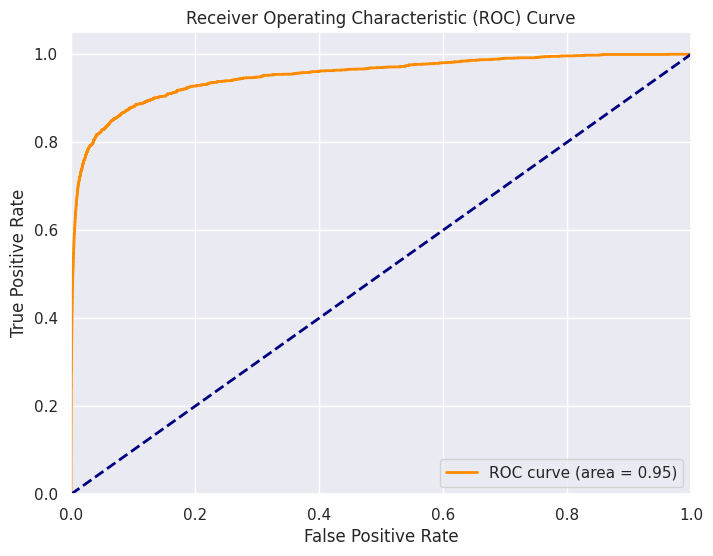

In [133]:
y_pred_prob = xgb_adasyn.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

> #### Metrics for Random Forest - SMOTE:
- Recall on Train: 0.86
- Recall on Test: 0.81
- Area Under the Curve: 0.95

# `Testing the results on the unseen Test Data:`

In [22]:
# Reading the test dataset

df_test = pd.read_csv('fraudTest.csv')
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,...,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,...,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,...,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,...,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,...,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [167]:
# Considering only the relevant columns/features in a new dataframe

fraudTest = df_test[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraudTest.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2.86,M,33.9659,-80.9355,333497,1968-03-19,33.986391,-81.200714,0
1,2020-06-21 12:14:33,29.84,F,40.3207,-110.4360,302,1990-01-17,39.450498,-109.960431,0
2,2020-06-21 12:14:53,41.28,F,40.6729,-73.5365,34496,1970-10-21,40.495810,-74.196111,0
3,2020-06-21 12:15:15,60.05,M,28.5697,-80.8191,54767,1987-07-25,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3.19,M,44.2529,-85.0170,1126,1955-07-06,44.959148,-85.884734,0


In [168]:
fraudTrain.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
0,1.603420,1,8.159089,31,2,1,10.509708
1,4.674976,1,5.003946,41,2,1,30.171468
2,5.394127,0,8.331827,57,2,1,107.746268
3,3.806662,0,7.569928,52,2,1,97.629363
4,3.736717,0,4.595120,33,2,1,66.236025


In [169]:
# Converting columns to datetime for fraudTest

fraudTest.dob = pd.to_datetime(fraudTest['dob'])
fraudTest.trans_date_trans_time = pd.to_datetime(fraudTest['trans_date_trans_time'])

In [170]:
# Creating a new column called Transaction date and converting into datetime

fraudTest['Transaction_Date'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraudTest.Transaction_Date = pd.to_datetime(fraudTest['Transaction_Date'])

In [171]:
# Creating a new column called Transaction Time

fraudTest['Transaction_Time'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [172]:
# Creating a new column called Age

fraudTest['Age'] = round((fraudTest['Transaction_Date'] - fraudTest['dob'])/np.timedelta64(1, 'Y'))
fraudTest.Age = fraudTest.Age.astype('int')

In [173]:
fraudTest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   trans_date_trans_time  555719 non-null  datetime64[ns]
 1   amt                    555719 non-null  float64       
 2   gender                 555719 non-null  object        
 3   lat                    555719 non-null  float64       
 4   long                   555719 non-null  float64       
 5   city_pop               555719 non-null  int64         
 6   dob                    555719 non-null  datetime64[ns]
 7   merch_lat              555719 non-null  float64       
 8   merch_long             555719 non-null  float64       
 9   is_fraud               555719 non-null  int64         
 10  Transaction_Date       555719 non-null  datetime64[ns]
 11  Transaction_Time       555719 non-null  object        
 12  Age                    555719 non-null  int6

In [174]:
# Calling the function created earlier to calculate the Day of the Week

fraudTest['Day_of_Week'] = fraudTest['Transaction_Date'].apply(DoW)

In [175]:
# Creating a new column Month

fraudTest['Month'] = pd.DatetimeIndex(fraudTest.trans_date_trans_time).month

# Making Gender column binary

fraudTest['gender'] = fraudTest['gender'].map({'F':1, 'M':0})

# Ensuring Day of Week is represented numerically
fraudTest['Day_of_Week'] = fraudTest['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [176]:
# Calling the function created earlier to calculate the Distance between the customer's home location and
# the location of transactions (fraudulent or otherwise)

Dist2 = []
for a,b,c,d in zip(fraudTest['lat'], fraudTest['long'], fraudTest['merch_lat'], fraudTest['merch_long']):
    Dist2.append(haversineDistance(a,b,c,d))

In [177]:
# Adding the calculated Distance column in the test dataframe

fraudTest['Dist'] = Dist2
fraudTest.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,Transaction_Date,Transaction_Time,Age,Day_of_Week,Month,Dist
0,2020-06-21 12:14:25,2.86,0,33.9659,-80.9355,333497,1968-03-19,33.986391,-81.200714,0,2020-06-21,12:14:25,52,7,6,24.748687
1,2020-06-21 12:14:33,29.84,1,40.3207,-110.4360,302,1990-01-17,39.450498,-109.960431,0,2020-06-21,12:14:33,30,7,6,98.988771
2,2020-06-21 12:14:53,41.28,1,40.6729,-73.5365,34496,1970-10-21,40.495810,-74.196111,0,2020-06-21,12:14:53,50,7,6,73.344386
3,2020-06-21 12:15:15,60.05,0,28.5697,-80.8191,54767,1987-07-25,28.812398,-80.883061,0,2020-06-21,12:15:15,33,7,6,27.746011
4,2020-06-21 12:15:17,3.19,0,44.2529,-85.0170,1126,1955-07-06,44.959148,-85.884734,0,2020-06-21,12:15:17,65,7,6,105.772207


In [178]:
# Dropping unnecessary columns

fraudTest.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob',
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraudTest.head()

,amt,gender,city_pop,is_fraud,Age,Day_of_Week,Month,Dist
0,2.86,0,333497,0,52,7,6,24.748687
1,29.84,1,302,0,30,7,6,98.988771
2,41.28,1,34496,0,50,7,6,73.344386
3,60.05,0,54767,0,33,7,6,27.746011
4,3.19,0,1126,0,65,7,6,105.772207


In [179]:
fraudTest['amt'] = np.log(fraudTest['amt'])
fraudTest['city_pop'] = np.log(fraudTest['city_pop'])

## `Model Selection and Model Building`
> Based on the Recall scores, AUC Scores, and Confusion Matrices collected from the 12 algorithms (4 algorithms - unsampled and sampled), following is the summary of all values to help us pick the best model of all:

In [180]:
summary_dict = {
    'Model': ['Logistic Regression - Unsampled', 'Logistic Regression - SMOTE', 'Logistic Regression - ADASYN',
             'Decision Trees - Unsampled', 'Decision Trees - SMOTE', 'Decision Trees - ADASYN',
             'Random Forest - Unsampled', 'Random Forest - SMOTE', 'Random Forest - ADASYN',
             'XGBoost - Unsampled', 'XGBoost - SMOTE', 'XGBoost - ADASYN'],
    'Recall on Train' : [0.0,0.77,0.73,0.30,0.85,0.85,0.22,0.82,0.81,0.67,0.87,0.86],
    'Recall on Test' : [0.99,1.0,1.0,0.28,0.82,0.82,0.18,0.78,0.79,0.47,0.80,0.80],
    'AUC Score' : [0.52,0.56,0.60,0.73,0.93,0.93,0.96,0.94,0.93,0.98,0.95,0.95]
}

summary_df = pd.DataFrame(summary_dict)
summary_df

,Model,Recall on Train,Recall on Test,AUC Score
0,Logistic Regression - Unsampled,0.00,0.99,0.52
1,Logistic Regression - SMOTE,0.77,1.00,0.56
2,Logistic Regression - ADASYN,0.73,1.00,0.60
3,Decision Trees - Unsampled,0.30,0.28,0.73
4,Decision Trees - SMOTE,0.85,0.82,0.93
5,Decision Trees - ADASYN,0.85,0.82,0.93
6,Random Forest - Unsampled,0.22,0.18,0.96
7,Random Forest - SMOTE,0.82,0.78,0.94
8,Random Forest - ADASYN,0.81,0.79,0.93
9,XGBoost - Unsampled,0.67,0.47,0.98


In [181]:
summary_df.sort_values('AUC Score', ascending = False)

,Model,Recall on Train,Recall on Test,AUC Score
9,XGBoost - Unsampled,0.67,0.47,0.98
6,Random Forest - Unsampled,0.22,0.18,0.96
10,XGBoost - SMOTE,0.87,0.80,0.95
11,XGBoost - ADASYN,0.86,0.80,0.95
7,Random Forest - SMOTE,0.82,0.78,0.94
4,Decision Trees - SMOTE,0.85,0.82,0.93
5,Decision Trees - ADASYN,0.85,0.82,0.93
8,Random Forest - ADASYN,0.81,0.79,0.93
3,Decision Trees - Unsampled,0.30,0.28,0.73
2,Logistic Regression - ADASYN,0.73,1.00,0.60


### Based on the AUC Scores & Recall on Train and Test, checking the final test dataset

In [182]:
# Splitting the test data into X and y:

y_final = fraudTest.pop('is_fraud')
X_final = fraudTest

### Testing the unseen data by using XGBoost - ADASYN Modelled Predictors:

In [183]:
y_pred_xgb = xgb_best_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_xgb))
print(confusion_matrix(y_final, y_pred_xgb))

0.7426573426573426
[[530761  22813]
 [   552   1593]]


`XGBoost - ADASYN has a 74% recall score`

### Testing the unseen data by using XGBoost - SMOTE Modelled Predictors:

In [184]:
y_pred_xgb_ = xgb_best_smote.predict(X_final)
print(recall_score(y_final, y_pred_xgb_))
print(confusion_matrix(y_final, y_pred_xgb_))

0.737995337995338
[[531837  21737]
 [   562   1583]]


`XGBoost - SMOTE has a 74% recall score`

### Testing the unseen data by using Decision Tree - SMOTE Modelled Predictors:

In [185]:
y_pred_final_dt = dt_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_dt))
print(confusion_matrix(y_final, y_pred_final_dt))

0.7818181818181819
[[516464  37110]
 [   468   1677]]


`Decision Tree - SMOTE has a 78% recall score`

### Testing the unseen data by using Decision Tree - ADASYN Modelled Predictors:

In [186]:
y_pred_final_dt_ = dt_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_dt_))
print(confusion_matrix(y_final, y_pred_final_dt_))

0.7687645687645688
[[521745  31829]
 [   496   1649]]


`Decision Tree - ADASYN has a 77% recall score`

### Testing the unseen data by using Random Forest - SMOTE Modelled Predictors:

In [187]:
y_pred_final_rf = rf_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_rf))
print(confusion_matrix(y_final, y_pred_final_rf))

0.7421911421911422
[[538318  15256]
 [   553   1592]]


`Random Forest - SMOTE has a 74% recall score`

### Testing the unseen data by using Random Forest - ADASYN Modelled Predictors:

In [188]:
y_pred_final_rf_ = rf_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_rf_))
print(confusion_matrix(y_final, y_pred_final_rf_))

0.7463869463869464
[[537746  15828]
 [   544   1601]]


`Random Forest - ADASYN has a 75% recall score`

------

> ## Decision Trees - ADASYN model is the best as it has 77.2% Sensitivity towards predicting Fraudulent Transactions

In [189]:
# Let us check the confusion matrix for this test data:

cnf = confusion_matrix(y_final, y_pred_final_dt_)
cnf

array([[521745,  31829],
       [   496,   1649]])

In [190]:
# Creating a dataframe to compare the actual v/s predicted values of y:

y_pred_final_dt_ = pd.Series(y_pred_final_dt_)
df_pred = pd.concat([X_final, y_final,y_pred_final_dt_], axis = 1)
df_pred.rename(columns = {0:'y_pred'}, inplace = True)
df_pred.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist,is_fraud,y_pred
0,1.050822,0,12.717389,52,7,6,24.748687,0,0
1,3.395850,1,5.710427,30,7,6,98.988771,0,0
2,3.720378,1,10.448599,50,7,6,73.344386,0,0
3,4.095178,0,10.910843,33,7,6,27.746011,0,0
4,1.160021,0,7.026427,65,7,6,105.772207,0,0


In [191]:
# Extracting only the fraudulent transactions from this test dataset:

fraud_df = df_pred[df_pred.is_fraud==1]
fraud_df.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist,is_fraud,y_pred
1685,3.212455,1,3.135494,51,7,6,80.136594,1,0
1767,6.659960,0,7.174724,62,7,6,12.776135,1,1
1781,6.430252,0,7.174724,62,7,6,24.637848,1,1
1784,6.982575,0,11.175142,26,7,6,98.706628,1,1
1857,6.736552,1,3.135494,51,7,6,60.505374,1,1


### Let's check the AUC on the final test data

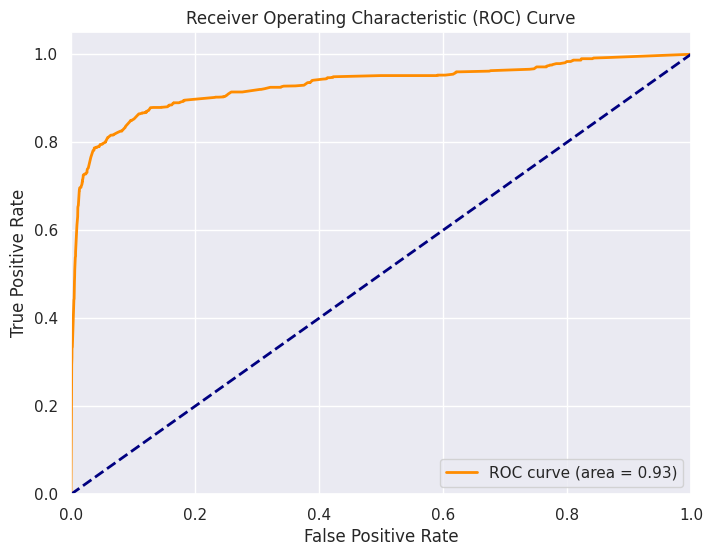

In [193]:
y_pred_prob = dt_adasyn.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

`Area Under the Curve is 0.93`

-----

> # `Cost Benefit Analysis`
- The Cost Benefit Analysis is to be done on the original data
- Merging the train and test data to make an original dataframe

In [194]:
# Let us merge the dataset to form the original

fraud = pd.concat([df, df_test], axis=0)
fraud.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


#### Let us take a look at what we need to do in order to perform the cost-benefit analysis step by step:
- ### Part I: Analyse the dataset and find the following figures:

> 1. Average number of transactions per month
> 2. Average number of fraudulent transactions per month
> 3. Average amount per fraudulent transaction

In [195]:
# Since the given (original) dataset is from Jan 1 2019 to Dec 31 2020, the data is of 24 months
# Total transactions can be found by checking the shape of the original dataframe
# Avg transactions per month would be to divide that shape/total by 24 (months)

avg_transactions_pm = fraud.shape[0]//24

In [196]:
print("1. Average number of transactions per month are:", avg_transactions_pm)

1. Average number of transactions per month are: 77183


In [197]:
# Checking only for fraudulent transactions:

fraud[fraud.is_fraud == 1]

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
2449,2449,2019-01-02 01:06:37,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.06,Jason,Murphy,M,542 Steve Curve Suite 011,...,35.9946,-81.7266,885,Soil scientist,1988-09-15,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,36.430124,-81.179483,1
2472,2472,2019-01-02 01:47:29,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.52,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,bc7d41c41103877b03232f03f1f8d3f5,1325468849,29.819364,-99.142791,1
2523,2523,2019-01-02 03:05:23,340187018810220,fraud_Goodwin-Nitzsche,grocery_pos,276.31,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,b98f12f4168391b2203238813df5aa8c,1325473523,29.273085,-98.836360,1
2546,2546,2019-01-02 03:38:03,4613314721966,fraud_Erdman-Kertzmann,gas_transport,7.03,Jason,Murphy,M,542 Steve Curve Suite 011,...,35.9946,-81.7266,885,Soil scientist,1988-09-15,397894a5c4c02e3c61c784001f0f14e4,1325475483,35.909292,-82.091010,1
2553,2553,2019-01-02 03:55:47,340187018810220,fraud_Koepp-Parker,grocery_pos,275.73,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,7863235a750d73a244c07f1fb7f0185a,1325476547,29.786426,-98.683410,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,517197,2020-12-22 22:05:48,2242176657877538,"fraud_Willms, Kris and Bergnaum",shopping_pos,1041.51,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,35b0297dd026d2e9a75d024a5dec7955,1387749948,34.573471,-89.911011,1
517274,517274,2020-12-22 22:18:07,2242176657877538,fraud_Kuhn LLC,shopping_pos,868.09,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,da7f67d7375f10a054a3d919448c45dd,1387750687,34.091227,-90.390612,1
517341,517341,2020-12-22 22:31:48,2242176657877538,"fraud_Mosciski, Ziemann and Farrell",shopping_net,1039.42,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,25b076c7bcd70f272c1c5326bb234f4b,1387751508,34.628434,-90.284780,1
517529,517529,2020-12-22 23:06:03,2242176657877538,fraud_Bauch-Raynor,grocery_pos,289.27,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,2df7d894868fbc99ec1d8b055585fc9d,1387753563,34.746063,-90.401093,1


In [198]:
# Fraudulent transactions are 9651 (number of rows) that are spread across 24 months
# Avg fraudulent transactions per month would be to divide the shape/total fraudulent rows by 24 (months)

avg_fraudtrans_pm = fraud[fraud.is_fraud == 1].shape[0]//24

In [199]:
print("2. Average number of fraudulent transactions per month are:", avg_fraudtrans_pm)

2. Average number of fraudulent transactions per month are: 402


In [200]:
# Average amount of fraud is the total fraudulent amount divided by the total number of fraudulent transactions

avg_fraud_amt = fraud[fraud.is_fraud == 1].amt.sum()//fraud[fraud.is_fraud == 1].shape[0]

In [201]:
print("3. Average amount per fraudulent transactions is:", avg_fraud_amt)

3. Average amount per fraudulent transactions is: 530.0


- ### Part II: Compare the cost incurred per month by the bank before and after the model deployment:

1. Cost incurred per month before the model was deployed = Average amount per fraudulent transaction * Average number of fraudulent transactions per month
2. Cost incurred per month after the model is built and deployed: (Use the test metric from the model evaluation part and the calculations performed in Part I to compute the values given below)


- Let TF be the average number of transactions per month detected as fraudulent by the model and let the cost of providing customer executive support per fraudulent transaction detected by the model = USD 1.5

- Total cost of providing customer support per month for fraudulent transactions detected by the model = 1.5 * TF.
- Let FN be the average number of transactions per month that are fraudulent but not detected by the model

- Cost incurred due to these fraudulent transactions left undetected by the model = Average amount per fraudulent transaction * FN
- Therefore, the cost incurred per month after the model is built and deployed = 1.5 * TF + Average amount per fraudulent transaction * FN
- Final savings = Cost incurred before - Cost incurred after

In [202]:
# Calculating the cost incurred before deploying the model based on the first point descibed above:

cost_before_model = avg_fraud_amt*avg_fraudtrans_pm
cost_before_model

213060.0

In [205]:
# Let TF be the average number of transactions per month detected as fraudulent by the model
# Since the test dataframe has 7 months data, dividing by 7

TF = fraud_df.y_pred.sum()//7
#TF = 235
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =", TF*1.5)

Total cost of providing customer support per month for fraudulent transactions detected by the model = 352.5


In [206]:
# Let FN be the average number of transactions per month that are fraudulent but not detected by the model
# Since the test dataframe has 7 months data, dividing by 7

FN = fraud_df[fraud_df.y_pred==0].is_fraud.sum()//7
#FN = 70
print("Cost incurred due to these fraudulent transactions left undetected by the model =", FN*avg_fraud_amt)

Cost incurred due to these fraudulent transactions left undetected by the model = 37100.0


In [207]:
# Cost incurred after the model is deployed:

cost_after_model = (TF*1.5) + (FN*avg_fraud_amt)
cost_after_model

37452.5

In [208]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(cost_before_model - cost_after_model)
print("Final Savings after deploying the model are: $",Final_Savings)
#Final figure is rounded to zero decimal $ 175607.50 rounded to $ 175607

Final Savings after deploying the model are: $ 175607
